<a href="https://colab.research.google.com/github/neelima-2003/Regression/blob/main/Linear_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Linear Regression with Scikit Learn - Machine Learning with Python

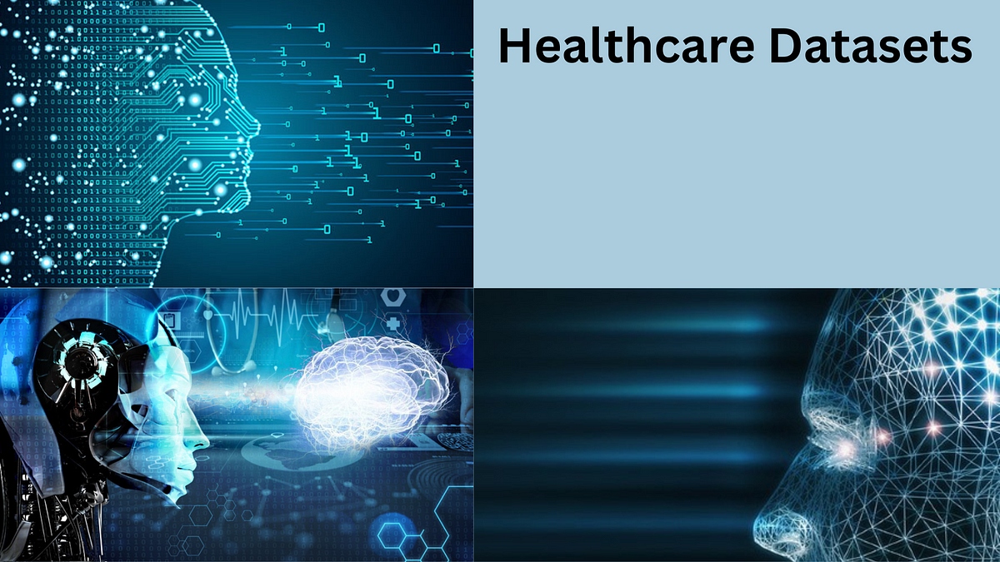

The following topics are covered in this tutorial:

- A typical problem statement for machine learning
- Downloading and exploring a dataset for machine learning
- Linear regression with one variable using Scikit-learn
- Linear regression with multiple variables
- Using categorical features for machine learning
- Regression coefficients and feature importance
- Other models and techniques for regression using Scikit-learn
- Applying linear regression to other datasets

### How to run the code

This tutorial is an executable [Jupyter notebook](https://jupyter.org) You can _run_ this tutorial and experiment with the code examples in a couple of ways: *using free online resources* (recommended) or *on your computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing the code is to click the **Run** button at the top of this page and select **Run on Binder**. You can also select "Run on Colab" or "Run on Kaggle", but you'll need to create an account on [Google Colab](https://colab.research.google.com) or [Kaggle](https://kaggle.com) to use these platforms.


#### Option 2: Running on your computer locally

To run the code on your computer locally, you'll need to set up [Python](https://www.python.org), download the notebook and install the required libraries. We recommend using the [Conda](https://docs.conda.io/projects/conda/en/latest/user-guide/install/) distribution of Python. Click the **Run** button at the top of this page, select the **Run Locally** option, and follow the instructions.

>  **Jupyter Notebooks**: This tutorial is a [Jupyter notebook](https://jupyter.org) - a document made of _cells_. Each cell can contain code written in Python or explanations in plain English. You can execute code cells and view the results, e.g., numbers, messages, graphs, tables, files, etc., instantly within the notebook. Jupyter is a powerful platform for experimentation and analysis. Don't be afraid to mess around with the code & break things - you'll learn a lot by encountering and fixing errors. You can use the "Kernel > Restart & Clear Output" menu option to clear all outputs and start again from the top.

## Problem Statement

This tutorial takes a practical and coding-focused approach. We'll define the terms _machine learning_ and _linear regression_ in the context of a problem, and later generalize their definitions. We'll work through a typical machine learning problem step-by-step:


> **QUESTION**: ACME Insurance Inc. offers affordable health insurance to thousands of customer all over the United States. As the lead data scientist at ACME, **you're tasked with creating an automated system to estimate the annual medical expenditure for new customers**, using information such as their age, sex, BMI, children, smoking habits and region of residence.
>
> Estimates from your system will be used to determine the annual insurance premium (amount paid every month) offered to the customer. Due to regulatory requirements, you must be able to explain why your system outputs a certain prediction.
>
> Dataset source: https://www.kaggle.com/datasets/truongthanh081203/healthcare-dataset




## Downloading the Data

To begin, let's download the data using the `urlretrieve` function from `urllib.request`.

In [ ]:
# from urllib.request import urlretrieve

We can now create a Pandas dataframe using the downloaded file, to view and analyze the data.

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
care = pd.read_csv('/content/healthcare_dataset.csv')

In [ ]:
care

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,eLIZABeTH jaCkSOn,42,Female,O+,Asthma,2020-08-16,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.714952,417,Elective,2020-09-15,Penicillin,Abnormal
55496,KYle pEREz,61,Female,AB-,Obesity,2020-01-23,Taylor Sullivan,Tucker-Moyer,Cigna,31457.797307,316,Elective,2020-02-01,Aspirin,Normal
55497,HEATher WaNG,38,Female,B+,Hypertension,2020-07-13,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.764717,347,Urgent,2020-08-10,Ibuprofen,Abnormal
55498,JENniFER JOneS,43,Male,O-,Arthritis,2019-05-25,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.092358,321,Elective,2019-05-31,Ibuprofen,Abnormal


The dataset contains 55500 rows and 15 columns. Each row of the dataset contains information about one customer.

Our objective is to find a way to estimate the value in the "Billing Amount" column using the values in the other columns. If we can do so for the historical data, then we should able to estimate billing amount for new customers too, simply by asking for information like their age, gender, Blood type, medical condition, Doctor,Hospital,Admission Type etc.,

Let's check the data type for each column.

In [ ]:
care.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55500 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                55500 non-null  object 
 1   Age                 55500 non-null  int64  
 2   Gender              55500 non-null  object 
 3   Blood Type          55500 non-null  object 
 4   Medical Condition   55500 non-null  object 
 5   Date of Admission   55500 non-null  object 
 6   Doctor              55500 non-null  object 
 7   Hospital            55500 non-null  object 
 8   Insurance Provider  55500 non-null  object 
 9   Billing Amount      55500 non-null  float64
 10  Room Number         55500 non-null  int64  
 11  Admission Type      55500 non-null  object 
 12  Discharge Date      55500 non-null  object 
 13  Medication          55500 non-null  object 
 14  Test Results        55500 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.4

Looks like "age", "billing amount", "room number" are numbers, whereas other columns are strings(possibly categories). None of the columns contain any missing values, which saves us a fair bit of work!

Here are some statistics for the numerical columns:

In [ ]:
care_df = care.describe()

The ranges of values in the numerical columns seem reasonable too (no negative ages!), so we may not have to do much data cleaning or correction. The "Billing Amount	" column seems to be significantly skewed however, as the median (50 percentile) is much lower than the maximum value.


## Exploratory Analysis and Visualization

Let's explore the data by visualizing the distribution of values in some columns of the dataset, and the relationships between "Billing Amount" and other columns.

We'll use libraries Matplotlib, Seaborn and Plotly for visualization.

In [ ]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

### Age

Age is a numeric column. The minimum age in the dataset is 18 and the maximum age is 85. Thus, we can visualize the distribution of age using a histogram with 47 bins (one for each year) and a box plot. We'll use plotly to make the chart interactive, but you can create similar charts using Seaborn.

In [ ]:
care.Age.describe()

,Age
count,55500.000000
mean,51.539459
std,19.602454
min,13.000000
25%,35.000000
50%,52.000000
75%,68.000000
max,89.000000


In [ ]:
fig = px.histogram(care,
                   x = 'Age',
                   marginal='box',
                   nbins=47,
                   title='Age Distribution')
fig.update_layout(bargap=0.05)
fig.show()

The distribution of ages in the dataset is consists more variations for all ages.


### Billing Amount

Let's visualize the distribution of "Billing amount". This is the column we're trying to predict. Let's also use the categorical column "Gender" to distinguish the billing amount for male and female.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='Billing Amount', ylabel='Count'>

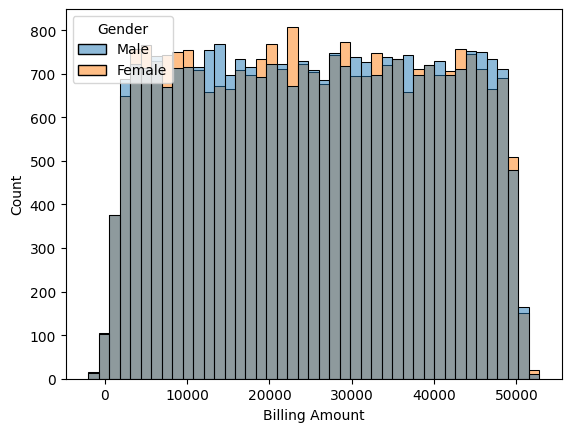

In [ ]:
sns.histplot(care, x='Billing Amount',hue='Gender')

In [ ]:
fig = px.histogram(care,
             x='Billing Amount',

             title = 'Total Amount',
             color='Gender')
fig.update_layout(bargap=0.05)
fig.show()

We can make the following observations from the above graph:

* For most customers, the total billing amount is very high. Only a small fraction of customer have lower billing amount.


### Gender

Let's visualize the distribution of the "Gender" column (containing values "Male" and "Female") using a histogram.

In [ ]:
px.histogram(care, x='Gender',color='Medical Condition')

It appears that most of the female people suffer from "Arthitis" disease and most of the male people suffer from "Asthma".

Having looked at individual columns, we can now visualize the relationship between "Billing Amount" (the value we wish to predict) and other columns.

### Age and Billing Amount

Let's visualize the relationship between "Age" and "Billing Amount" using a scatter plot. Each point in the scatter plot represents one customer. We'll also use values in the "Gender" column to color the points.

In [ ]:
px.scatter(care,
           x ='Age',
           y = 'Billing Amount',
           color='Gender',
           title = 'Age VS Billing Amount')

We can make the following observations from the above chart:

* The general trend seems to be that billing amount increase with age, as we might expect. However, there is significant variation at every age, and it's clear that age alone cannot be used to accurately determine billing amount.

### Medical Condition and Billing Amount

Let's visualize the relationship between medical condition and billing amount using another scatter plot. Once again, we'll use the values from the "Gender" column to color the points.

In [ ]:
px.scatter(care,
           x = 'Medical Condition',
           y ='Billing Amount',
           color = 'Gender',
           title = 'Medical Condition VS Billing Amount')

### Correlation
As you can tell from the analysis, the values in some columns are more closely related to the values in "Billing Amount" compared to other columns. E.g. "age" and "billing amount" seem to grow together, whereas "medical condition" and "billing amount" don't.

This relationship is often expressed numerically using a measure called the _correlation coefficient_, which can be computed using the `.corr` method of a Pandas series.

In [ ]:
care['Billing Amount'].corr(care.Age)

-0.0038319421186176704

To compute the correlation for categorical columns, they must first be converted into numeric columns.

In [ ]:
gender = {'Gender':{'Male':0,'Female':1}}
df = care.replace(gender)

<ipython-input-16-538ca4542f2d>:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
care['Medical Condition'].unique()

array(['Cancer', 'Obesity', 'Diabetes', 'Asthma', 'Hypertension',
       'Arthritis'], dtype=object)

In [ ]:
test = {'Cancer':0,'Obesity':1,'Diabetes':2,'Asthma':3,'Hypertension':4,'Arthritis':5}
df = care.replace(test)


<ipython-input-18-be12cfb65d45>:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,0,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,1,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,1,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,2,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,0,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,eLIZABeTH jaCkSOn,42,Female,O+,3,2020-08-16,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.714952,417,Elective,2020-09-15,Penicillin,Abnormal
55496,KYle pEREz,61,Female,AB-,1,2020-01-23,Taylor Sullivan,Tucker-Moyer,Cigna,31457.797307,316,Elective,2020-02-01,Aspirin,Normal
55497,HEATher WaNG,38,Female,B+,4,2020-07-13,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.764717,347,Urgent,2020-08-10,Ibuprofen,Abnormal
55498,JENniFER JOneS,43,Male,O-,5,2019-05-25,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.092358,321,Elective,2019-05-31,Ibuprofen,Abnormal


Here's how correlation coefficients can be interpreted ([source](https://statisticsbyjim.com/basics/correlations)):

* **Strength**: The greater the absolute value of the correlation coefficient, the stronger the relationship.

    * The extreme values of -1 and 1 indicate a perfectly linear relationship where a change in one variable is accompanied by a perfectly consistent change in the other. For these relationships, all of the data points fall on a line. In practice, you won’t see either type of perfect relationship.

    * A coefficient of zero represents no linear relationship. As one variable increases, there is no tendency in the other variable to either increase or decrease.
    
    * When the value is in-between 0 and +1/-1, there is a relationship, but the points don’t all fall on a line. As r approaches -1 or 1, the strength of the relationship increases and the data points tend to fall closer to a line.


* **Direction**: The sign of the correlation coefficient represents the direction of the relationship.

    * Positive coefficients indicate that when the value of one variable increases, the value of the other variable also tends to increase. Positive relationships produce an upward slope on a scatterplot.
    
    * Negative coefficients represent cases when the value of one variable increases, the value of the other variable tends to decrease. Negative relationships produce a downward slope.

Here's the same relationship expressed visually ([source](https://www.cuemath.com/data/how-to-calculate-correlation-coefficient/)):

<img src="https://i.imgur.com/3XUpDlw.png" width="360">

Pandas dataframes also provide a `.corr` method to compute the correlation coefficients between all pairs of numeric columns.

In [ ]:
care_df.corr()

,Age,Billing Amount,Room Number
Age,1.000000,0.561497,0.999984
Billing Amount,0.561497,1.000000,0.566027
Room Number,0.999984,0.566027,1.000000


The result of `.corr` is called a correlation matrix and is often visualized using a heatmap.

<Axes: >

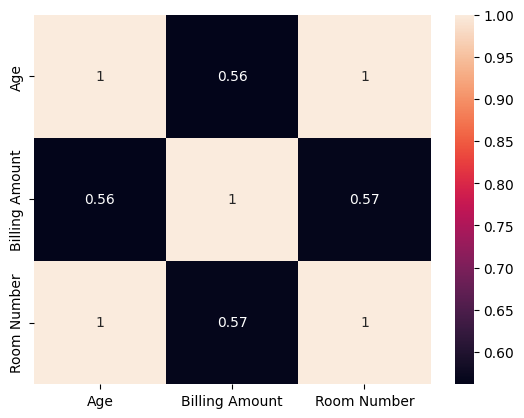

In [ ]:
sns.heatmap(care_df.corr(), annot=True)

**Correlation vs causation fallacy:** Note that a high correlation cannot be used to interpret a cause-effect relationship between features. Two features $X$ and $Y$ can be correlated if $X$ causes $Y$ or if $Y$ causes $X$, or if both are caused independently by some other factor $Z$, and the correlation will no longer hold true if one of the cause-effect relationships is broken. It's also possible that $X$ are $Y$ simply appear to be correlated because the sample is too small.

While this may seem obvious, computers can't differentiate between correlation and causation, and decisions based on automated system can often have major consequences on society, so it's important to study why automated systems lead to a given result. Determining cause-effect relationships requires human insight.

## Linear Regression using a Single Feature

We now know that the "Gender" and "Age" columns have the strongest correlation with "Billing Amount". Let's try to find a way of estimating the value of "Billing Amount" using the value of "Age" for male. First, let's create a data frame containing just the data for male.

In [ ]:
male_df = care[care.Gender == 'Male']
male_df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
5,EMILY JOHNSOn,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.110951,389,Urgent,2023-12-24,Ibuprofen,Normal
8,JASmINe aGuIlaR,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222792,316,Elective,2020-07-14,Aspirin,Abnormal
10,mIchElLe daniELs,72,Male,O+,Cancer,2020-04-19,John Duncan,Schaefer-Porter,Medicare,12576.795609,394,Urgent,2020-04-22,Paracetamol,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55489,ANdrEw AGUIlaR,69,Male,O-,Arthritis,2019-06-25,Dustin Pearson,"and Barry White, Jones",Medicare,41893.245150,171,Urgent,2019-07-09,Paracetamol,Normal
55490,STepHAniE oliVer,82,Male,B-,Cancer,2022-01-10,Gary Leblanc,Group Lee,Cigna,17350.543524,381,Emergency,2022-01-21,Penicillin,Abnormal
55492,LAuREn MCcormIcK,51,Male,O+,Arthritis,2020-12-06,Kevin Flores,Inc Barnett,Cigna,2588.150832,289,Emergency,2020-12-12,Paracetamol,Normal
55494,JEssIcA WHiTe,67,Male,O+,Arthritis,2023-12-11,Jesus Jordan,Miller-Harris,Medicare,42535.301234,378,Emergency,2024-01-04,Ibuprofen,Normal


Next, let's visualize the relationship between "age" and "billing amount"

<Axes: xlabel='Age', ylabel='Billing Amount'>

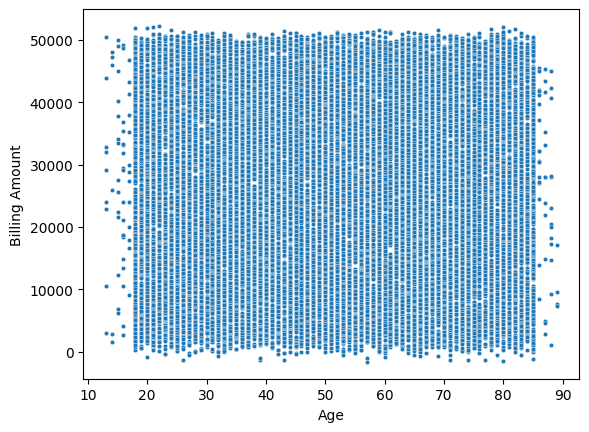

In [ ]:
sns.scatterplot(data=male_df, x='Age',y='Billing Amount',s=10)

Apart from a few exceptions, the points seem to form a line. We'll try and "fit" a line using this points, and use the line to predict charges for a given age. A line on the X&Y coordinates has the following formula:

$y = wx + b$

The line is characterized two numbers: $w$ (called "slope") and $b$ (called "intercept").

### Model

In the above case, the x axis shows "age" and the y axis shows "billing amount". Thus, we're assuming the following relationship between the two:

$charges = w \times age + b$

We'll try determine $w$ and $b$ for the line that best fits the data.

* This technique is called _linear regression_, and we call the above equation a _linear regression model_, because it models the relationship between "age" and "billing amount" as a straight line.

* The numbers $w$ and $b$ are called the _parameters_ or _weights_ of the model.

* The values in the "age" column of the dataset are called the _inputs_ to the model and the values in the billing amount column are called "targets".

Let define a helper function `estimate_charges`, to compute $charges$, given $age$, $w$ and $b$.


In [ ]:
def estimate_charges(age, w, b):
  return w * age + b

The estimate_charges function is our very first model.

Let's guess the values for  w  and  b  and use them to estimate the value for charges.




In [ ]:
w = 100
b = 500

In [ ]:
ages = male_df.Age
estimated_charges = estimate_charges(ages, w, b)

We can plot the estimated charges using a line graph.

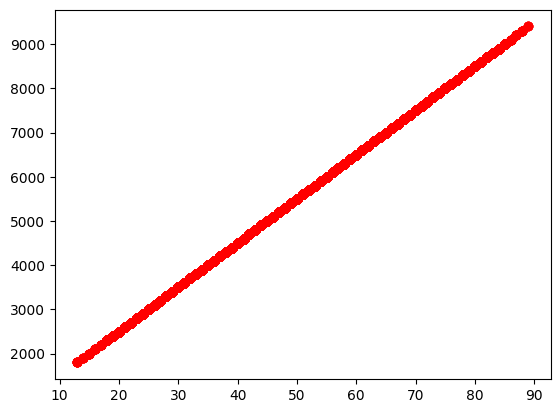

In [ ]:
plt.plot(ages,estimated_charges, 'r-o')

As expected, the points lie on a straight line.

We can overlay this line on the actual data, so see how well our _model_ fits the _data_.

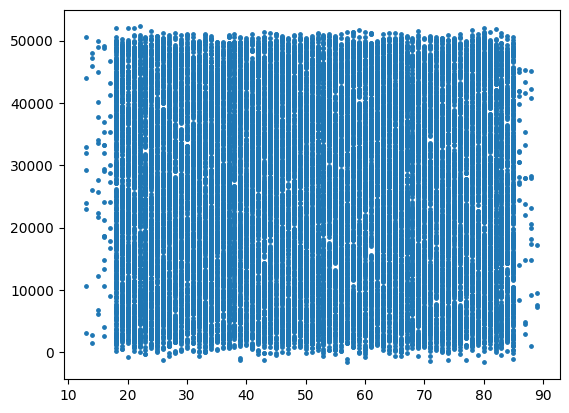

In [ ]:
target = male_df['Billing Amount']
plt.scatter(ages,target,s=6)

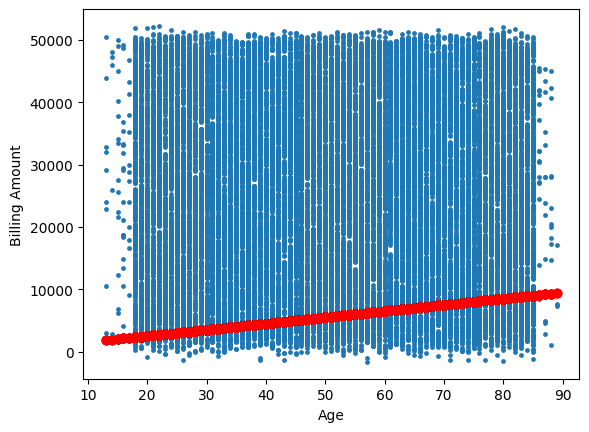

In [ ]:
target = male_df['Billing Amount']
plt.plot(ages,estimated_charges, 'r-o',alpha=0.7)
plt.scatter(ages,target,s=6)
plt.xlabel('Age');
plt.ylabel("Billing Amount");

Clearly, the our estimates are quite poor and the line does not "fit" the data. However, we can try different values of $w$ and $b$ to move the line around. Let's define a helper function `try_parameters` which takes `w` and `b` as inputs and creates the above plot.

In [ ]:
def try_parameters(w, b):
  ages = male_df['Age']
  target = male_df['Billing Amount']

  estimated_charges = estimate_charges(ages, w, b)

  plt.plot(ages,estimated_charges, 'r-o',alpha=0.7)
  plt.scatter(ages,target,s=6)
  plt.xlabel('Age');
  plt.ylabel("Billing Amount");

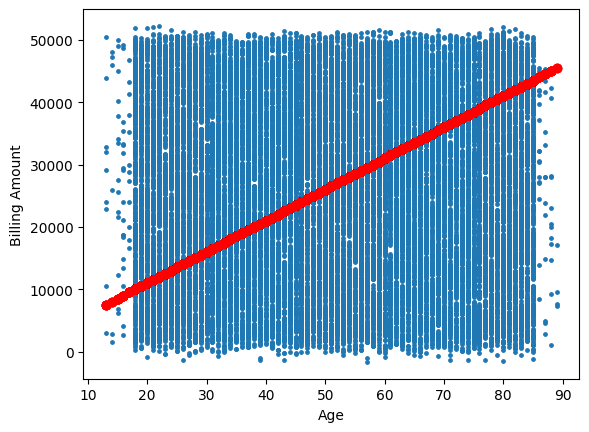

In [ ]:
try_parameters(500, 1000)

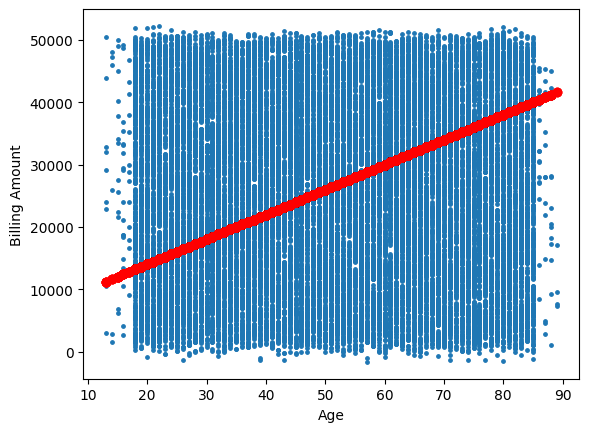

In [ ]:
try_parameters(400, 6000)

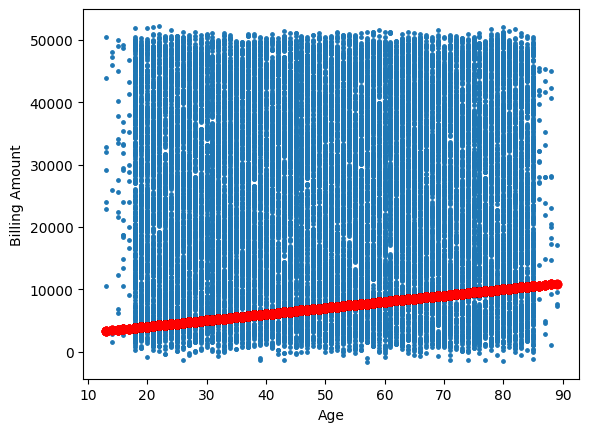

In [ ]:
try_parameters(100, 2000)

As we change the values, of  w  and  b  manually, trying to move the line visually closer to the points, we are learning the approximate relationship between "age" and "billing amount".

Wouldn't it be nice if a computer could try several different values of w and b and learn the relationship between "age" and "billing amount"? To do this, we need to solve a couple of problems:

We need a way to measure numerically how well the line fits the points.

Once the "measure of fit" has been computed, we need a way to modify w and b to improve the the fit.

If we can solve the above problems, it should be possible for a computer to determine w and b for the best fit line, starting from a random guess.






### Loss/Cost Function

We can compare our model's predictions with the actual targets using the following method:

* Calculate the difference between the targets and predictions (the differenced is called the "residual")
* Square all elements of the difference matrix to remove negative values.
* Calculate the average of the elements in the resulting matrix.
* Take the square root of the result

The result is a single number, known as the **root mean squared error** (RMSE). The above description can be stated mathematically as follows:

<img src="https://i.imgur.com/WCanPkA.png" width="360">

Geometrically, the residuals can be visualized as follows:

<img src="https://i.imgur.com/ll3NL80.png" width="420">

Let's define a function to compute the RMSE.

In [ ]:
def rmse(targets, predictions):
  return np.sqrt(np.mean(np.square(targets - predictions)))

In [ ]:
w = 100
b = 500

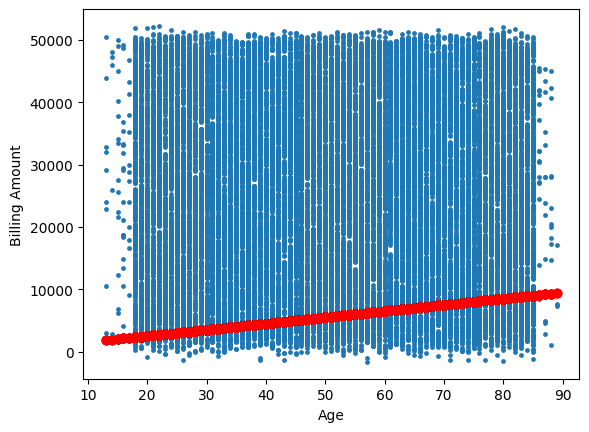

In [ ]:
try_parameters(w, b)

Let's compute the RMSE for our model with a sample set of weights

In [ ]:
targets = male_df['Billing Amount']
predicted = estimate_charges(male_df.Age, w, b)

In [ ]:
rmse(targets, predicted)

24584.993070088156

Here's how we can interpret the above number: *On average, each element in the prediction differs from the actual target by \\$24571*.

The result is called the *loss* because it indicates how bad the model is at predicting the target variables. It represents information loss in the model: the lower the loss, the better the model.

Let's modify the `try_parameters` functions to also display the loss.

In [ ]:
def try_parameters(w, b):
    ages = male_df['Age']
    target = male_df['Billing Amount']
    predictions = estimate_charges(ages, w, b)

    plt.plot(ages, predictions, 'r', alpha=0.9);
    plt.scatter(ages, target, s=8,alpha=0.8);
    plt.xlabel('Age');
    plt.ylabel('Billing Amount')
    plt.legend(['Prediction', 'Actual']);

    loss = rmse(targets, predictions)
    print("RMSE LOSS:" ,loss)

RMSE LOSS: 24584.993070088156


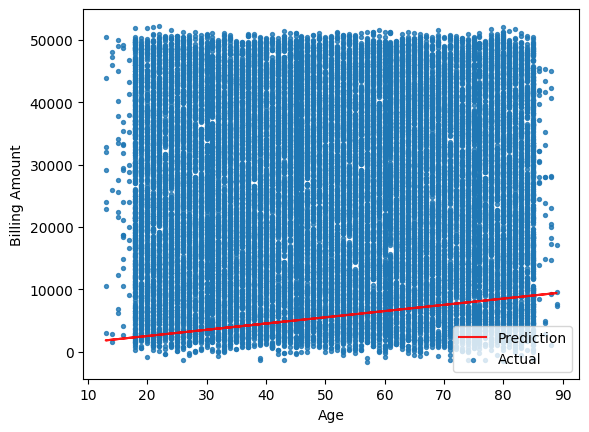

In [ ]:
try_parameters(100, 500)

RMSE LOSS: 17757.843864667655


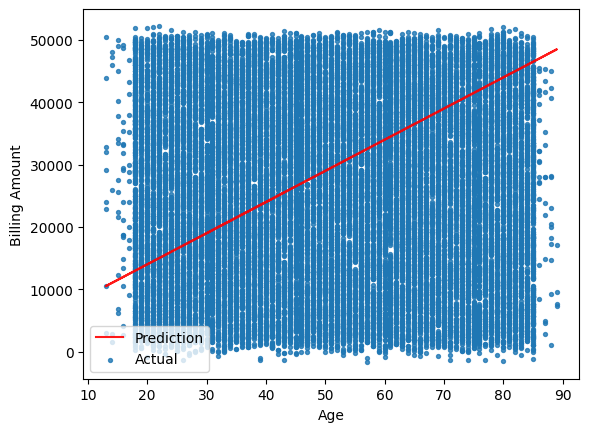

In [ ]:
try_parameters(500, 4000)

### Optimizer

Next, we need a strategy to modify weights `w` and `b` to reduce the loss and improve the "fit" of the line to the data.

* Ordinary Least Squares: (better for smaller datasets)
* Stochastic gradient descent: (better for larger datasets)

Both of these have the same objective: to minimize the loss, however, while ordinary least squares directly computes the best values for `w` and `b` using matrix operations, while gradient descent uses a iterative approach, starting with a random values of `w` and `b` and slowly improving them using derivatives.

Here's a visualization of how gradient descent works:

![](https://miro.medium.com/max/1728/1*NO-YvpHHadk5lLxtg4Gfrw.gif)

Doesn't it look similar to our own strategy of gradually moving the line closer to the points?

### Linear Regression using Scikit-learn

In practice, you'll never need to implement either of the above methods yourself. You can use a library like `scikit-learn` to do this for you.

In [ ]:
from sklearn.linear_model import LinearRegression

Let's use the LinearRegression class from scikit-learn to find the best fit line for "age" vs. "billing amount" using the ordinary least squares optimization technique.



First, we create a new model object.

In [ ]:
model = LinearRegression()

Next, we can use the fit method of the model to find the best fit line for the inputs and targets.

Not that the input X must be a 2-d array, so we'll need to pass a dataframe, instead of a single column.

In [ ]:
inputs = care[['Age']]
targets = care[['Billing Amount']]
print('Inputs.Shape:',inputs.shape)
print('Targets.Shape:',targets.shape)

Inputs.Shape: (55500, 1)
Targets.Shape: (55500, 1)


Let's fit the model to the data.

In [ ]:
model.fit(inputs, targets)

LinearRegression()

We can now make predictions using the model. Let's try predicting the charges for the ages 23, 30 and 76

In [ ]:
model.predict(np.array([[23],
                       [30],
                       [76]]))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([[25618.60141503],
       [25599.15475292],
       [25471.36240196]])

Do these values seem reasonable? Compare them with the scatter plot above.

Let compute the predictions for the entire set of inputs

In [ ]:
inputs

,Age
0,30
1,62
2,76
3,28
4,43
...,...
55495,42
55496,61
55497,38
55498,43


In [ ]:
predictions = model.predict(inputs)

In [ ]:
predictions

array([[25599.15475292],
       [25510.25572617],
       [25471.36240196],
       ...,
       [25576.92999624],
       [25563.0395233 ],
       [25535.25857744]])

Let's compute the RMSE loss to evaluate the model.

In [ ]:
rmse(targets, predictions)

14211.222060785647

Seems like our prediction is off by $14000 on average, which is not too bad considering the fact that there are several outliers.

The parameters of the model are stored in the `coef_` and `intercept_` properties.

In [ ]:
model.intercept_

array([25682.49759051])

In [ ]:
model.coef_

array([[-2.77809459]])

Are these parameters close to your best guesses?

Let's visualize the line created by the above parameters.

In [ ]:
try_parameters(-2.77809459,25682.49759051)

## Linear Regression using Multiple Features

So far, we've used on the "age" feature to estimate "billing amount". Adding another feature like "test results" is fairly straightforward. We simply assume the following relationship:

$charges = w_1 \times age + w_2 \times Medical Condition + b$

We need to change just one line of code to include the test results.

In [ ]:
# create inputs and targets
inputs, targets = df[['Age','Medical Condition']], df['Billing Amount']

# create and train model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# compute the loss
loss = rmse(targets, predictions)
print('Loss: ',loss)

Loss:  14211.175403897212


As you can see, adding the Medical Condition  the loss increased by more, as the test results has a very strong correlation with charges, especially for males.

In [ ]:
df['Billing Amount'].corr(df['Medical Condition'])

0.0025475689689200705

In [ ]:
px.scatter(df, x='Medical Condition',y='Billing Amount')

We can also visualize the relationship between all 3 variables "age", "Medical Condition " and "Billing Amount" using a 3D scatter plot.

In [ ]:
fig  = px.scatter_3d(df, x='Age',y='Medical Condition',z='Billing Amount')
fig.update_traces(marker_size = 4)
fig.show()

You can see that it's harder to interpret a 3D scatter plot compared to a 2D scatter plot. As we add more features, it becomes impossible to visualize all feature at once, which is why we use measures like correlation and loss.

Let's also check the parameters of the model.

In [ ]:
model.coef_, model.intercept_

(array([-2.78529456, 21.31236013]), 25629.52479602795)

Clearly, BMI has a much lower weightage, and you can see why. It has a tiny contribution, and even that is probably accidental. This is an important thing to keep in mind: you can't find a relationship that doesn't exist, no matter what machine learning technique or optimization algorithm you apply.

## Training, Validation and Test Sets

While building real-world machine learning models, it is quite common to split the dataset into three parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.


2. **Validation set** - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well. [Learn more here.](https://www.fast.ai/2017/11/13/validation-sets/)


3. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


<img src="https://i.imgur.com/j8eITrK.png" width="480">


As a general rule of thumb you can use around 60% of the data for the training set, 20% for the validation set and 20% for the test set. If a separate test set is already provided, you can use a 75%-25% training-validation split.


When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test and validation sets. This can be done using the `train_test_split` utility from `scikit-learn`. Learn more about it here: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_df, test_df = train_test_split(care, test_size = 0.2, random_state=42)

In [ ]:
train_df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
45174,CrAiG jIMENeZ,22,Female,O+,Arthritis,2022-01-01,Laura Le,Ltd Dixon,Aetna,42298.681572,336,Elective,2022-01-22,Ibuprofen,Abnormal
10214,tErreNCE coopEr,22,Male,B-,Diabetes,2020-09-20,Deborah Blackwell,"and Gates Stanley, Brennan",Blue Cross,2437.435883,486,Emergency,2020-10-12,Paracetamol,Normal
43199,RoBeRt fisheR,81,Female,A+,Arthritis,2023-02-24,Ralph Lopez,"White, Martinez and Frazier",UnitedHealthcare,5600.450992,392,Emergency,2023-03-17,Paracetamol,Abnormal
31626,nIcolE GuzmAN,80,Female,B+,Asthma,2024-02-23,Gary Perkins,Brown-Farmer,Blue Cross,39533.300775,225,Elective,2024-03-07,Paracetamol,Normal
9273,jamES burTOn,26,Female,AB+,Obesity,2023-03-04,Kevin Brown,"Bolton Arroyo and Valdez,",UnitedHealthcare,37691.176763,279,Elective,2023-03-31,Ibuprofen,Inconclusive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44732,sabRiNa cALDWeLL,27,Female,B-,Cancer,2023-01-24,Ashley Smith,"Jimenez Logan Lee, and",Cigna,28005.689380,358,Elective,2023-02-17,Paracetamol,Inconclusive
54343,jAmie CIsNERos,32,Male,AB-,Hypertension,2023-10-22,Alejandro Scott,Zuniga-Mann,UnitedHealthcare,2381.539677,213,Emergency,2023-10-30,Penicillin,Normal
38158,sHEiLA MoRgAN,24,Female,B-,Obesity,2019-08-30,Suzanne Lee,Inc Taylor,UnitedHealthcare,10502.693983,420,Emergency,2019-09-17,Lipitor,Inconclusive
860,keVIN wong,76,Male,A+,Asthma,2019-09-22,Kara Stevens,"Watson Johnson Joseph, and",Aetna,13014.330000,108,Emergency,2019-09-28,Aspirin,Abnormal


In [ ]:
test_df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
31641,mIchAEl thOrnTon mD,57,Male,O+,Diabetes,2023-09-15,Jason Hanson,Thornton-Roy,Medicare,3616.898450,339,Elective,2023-10-02,Aspirin,Inconclusive
9246,mattheW HUTcHiNsOn,51,Female,A+,Diabetes,2023-10-07,Jesse Gonzalez,Wilkerson-Lewis,Aetna,36970.075481,372,Emergency,2023-10-14,Penicillin,Abnormal
1583,RoNald paRK,20,Male,A+,Asthma,2019-09-09,Sarah Hernandez,Brown-Hughes,Blue Cross,44393.001348,148,Elective,2019-10-08,Penicillin,Inconclusive
36506,Jeff BroOkS,74,Female,B+,Obesity,2020-09-14,Cathy Sanchez,"Wilson, Alexander Wolf and",Aetna,27554.923708,135,Emergency,2020-09-21,Ibuprofen,Abnormal
11259,TAnya THoMPsOn,56,Male,AB-,Obesity,2023-02-01,Nancy Lee,"Winters, Blackburn Chandler and",Aetna,27466.318567,284,Emergency,2023-02-07,Paracetamol,Inconclusive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32183,CARLos RObiNsON,34,Male,O-,Arthritis,2020-10-31,Zachary Morgan,Rogers-Ryan,UnitedHealthcare,8351.418347,353,Elective,2020-11-21,Paracetamol,Abnormal
17967,CyNtHia TuRNer,46,Male,AB+,Asthma,2022-02-07,David Miller,Thomas and Sons,UnitedHealthcare,5575.897209,498,Elective,2022-03-03,Paracetamol,Normal
46192,DUstIn WAttS,74,Female,B+,Obesity,2019-12-14,Sylvia Mitchell,Brown Inc,UnitedHealthcare,38654.187027,437,Emergency,2020-01-01,Lipitor,Normal
43968,LIsa WILsON,55,Female,AB-,Cancer,2019-07-28,Martha Gomez,Carter-Gilbert,Aetna,5278.640155,184,Elective,2019-08-10,Ibuprofen,Abnormal


In [ ]:
train_inputs = train_df.iloc[:,:15]
train_targets = train_df['Billing Amount']
test_inputs = test_df.iloc[:,:15]
test_targets = test_df['Billing Amount']

In [ ]:
train_inputs.drop(columns=['Billing Amount'],axis=1,inplace=True)
test_inputs.drop(columns=['Billing Amount'],axis=1,inplace=True)

In [ ]:
print('train_df.shape:',train_df.shape)
print('test_df.shape:',test_df.shape)

train_df.shape: (44400, 15)
test_df.shape: (11100, 15)
